In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sqlite3
import numpy as np
from SlideRunner.dataAccess.database import Database
from tqdm import tqdm
from pathlib import Path
import openslide
import time
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from random import randint
import sys
sys.path.append('../')

from lib.sampling import get_slides
from data_loader import *
from lib.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric
from lib.object_detection_helper import *
from model.RetinaNetFocalLoss import RetinaNetFocalLoss
from model.RetinaNet import RetinaNet

size=256
path = Path('../')

database = Database()
database.open(str(path/'AblationStudy/databases/MITOS_WSI_CCMCT_ODAEL_50HPF.sqlite'))

slidelist_test = ['27', '30', '31', '6', '18', '20', '1', '2', '3' ,'9', '11']


## Split dataset into train/validation and test on slide level

In [2]:
lbl_bbox, train_slides,val_slides,files = get_slides(slidelist_test=slidelist_test, database=database, basepath='images/50HPF/pyramid/')

Loading slides .. : 100%|██████████| 32/32 [00:01<00:00, 21.99it/s]


Convert database into in-memory object

In [3]:
img2bbox = dict(zip(files, np.array(lbl_bbox)))
get_y_func = lambda o:img2bbox[o]

In [4]:
bs = 32 
train_images = 5000
val_images = 5000

train_files = list(np.random.choice([files[x] for x in train_slides], train_images))
valid_files = list(np.random.choice([files[x] for x in val_slides], val_images))

#train_files = list(np.random.choice(files, train_images))
#valid_files = list(np.random.choice(files, val_images))


In [5]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )


In [6]:
train =  ObjectItemListSlide(train_files, path=path)
valid = ObjectItemListSlide(valid_files, path=path)
valid = ObjectItemListSlide(valid_files, path=path)
item_list = ItemLists(path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate_min).normalize()

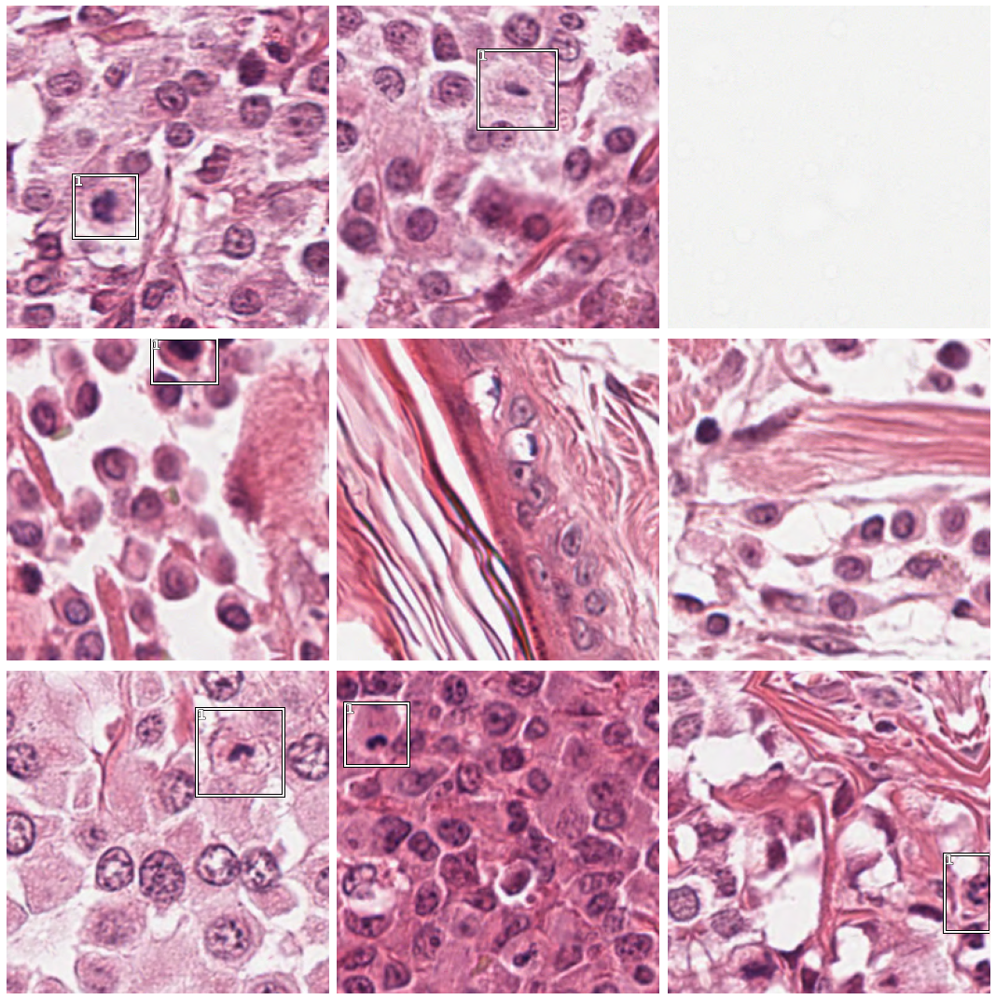

In [7]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

In [8]:
anchors = create_anchors(sizes=[(16,16)], ratios=[1], scales=[0.6, 0.7,0.8])


../lib/object_detection_helper.py:498: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)


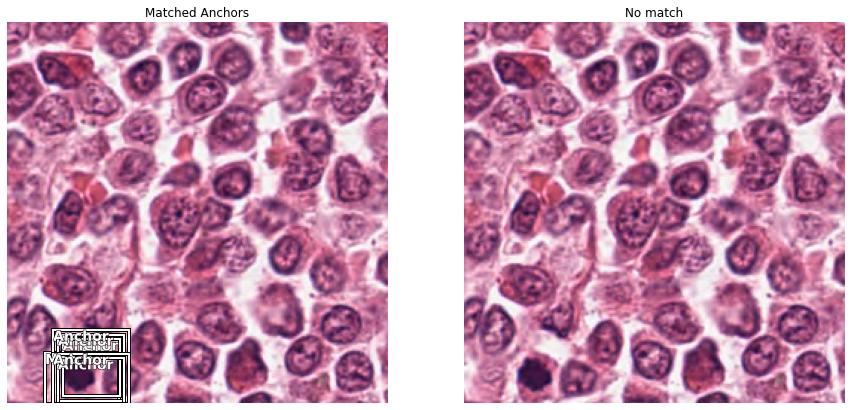

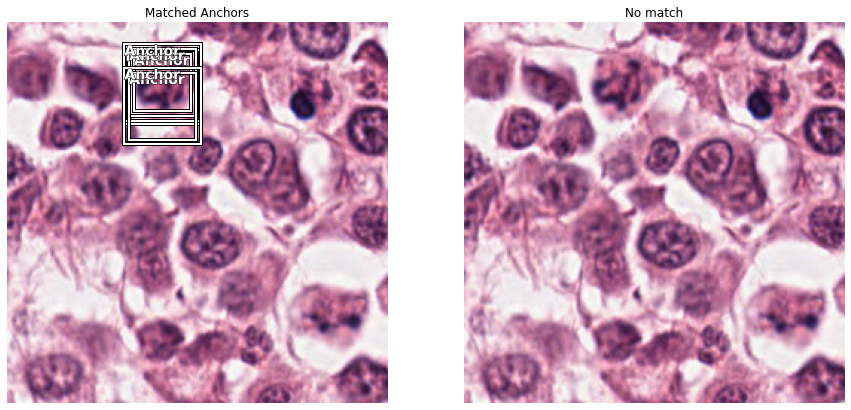

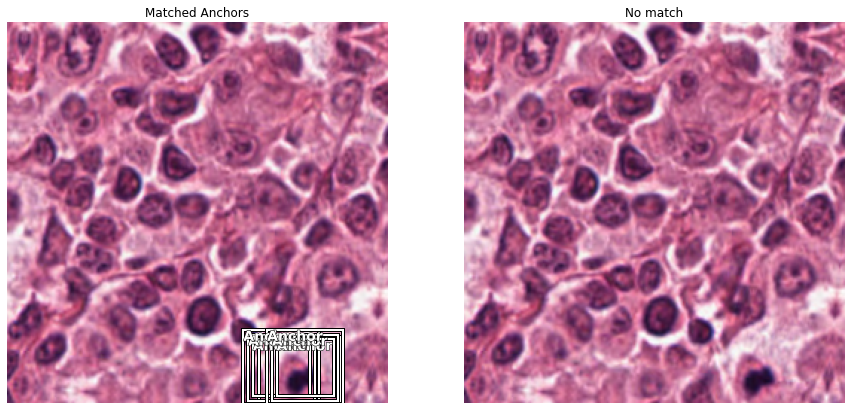

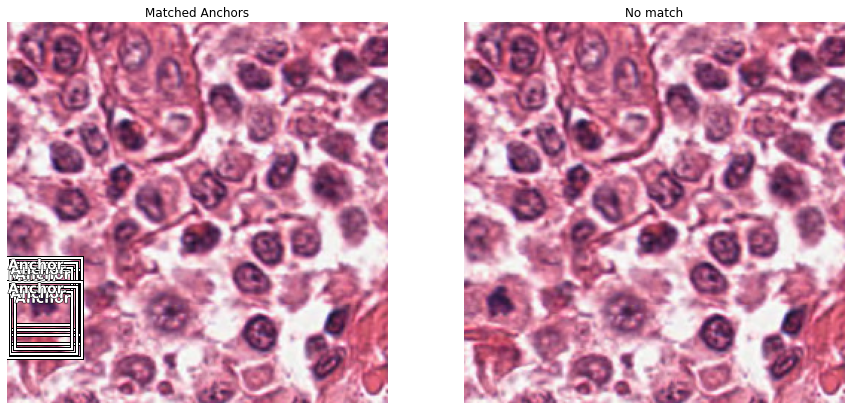

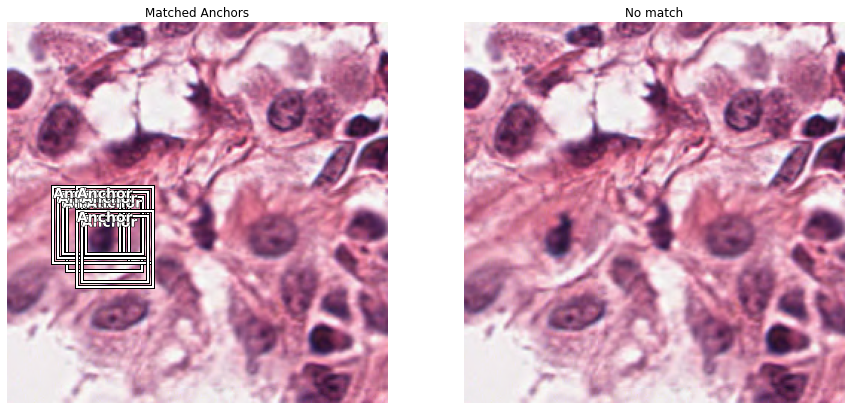

...

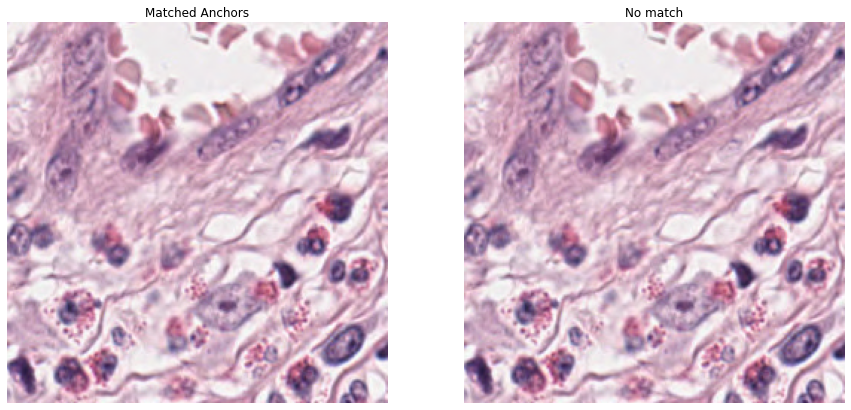

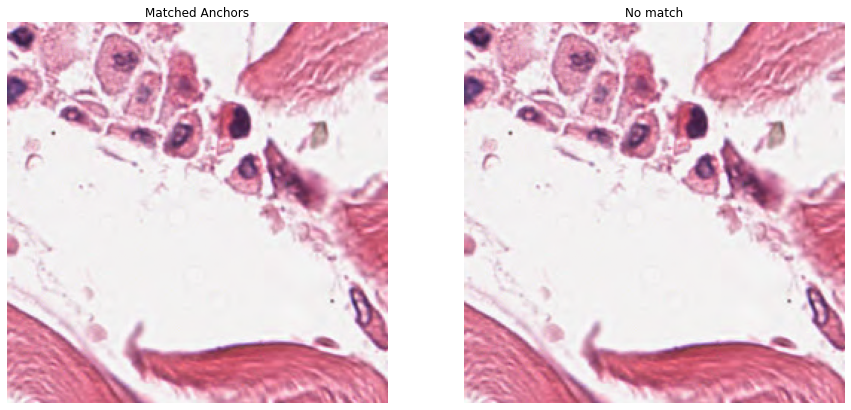

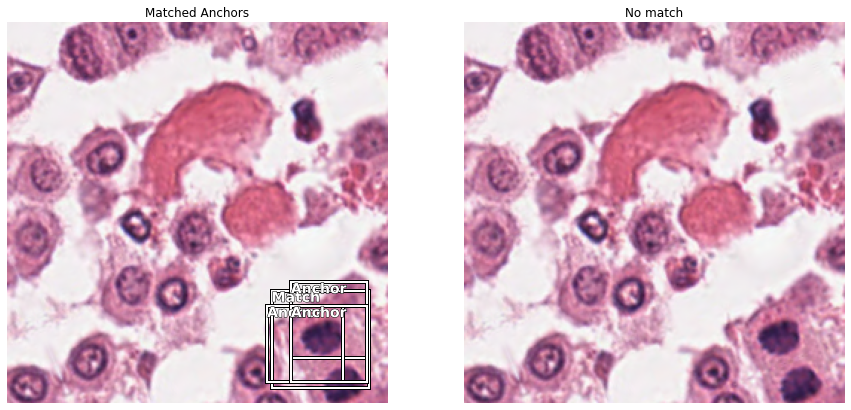

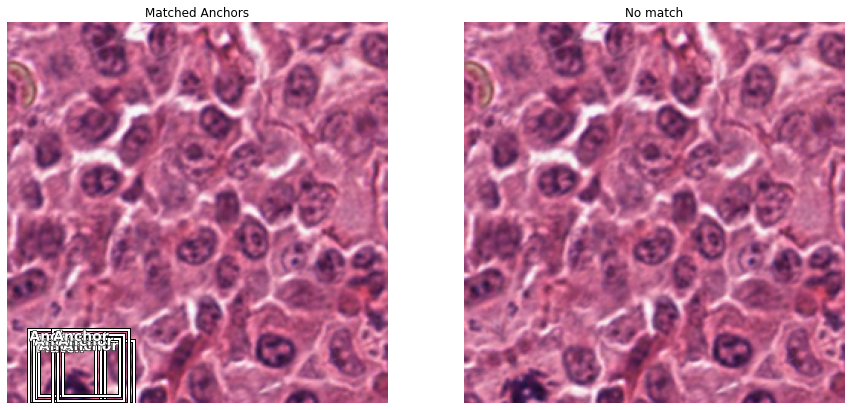

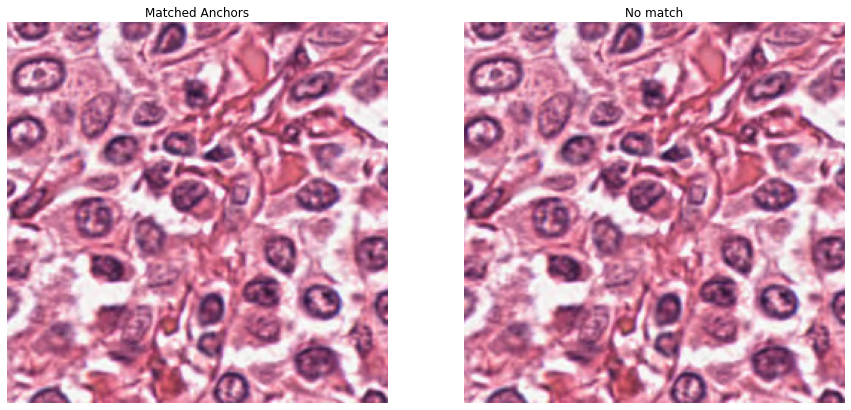

In [9]:
not_found = show_anchors_on_images(data, anchors)

In [10]:
crit = RetinaNetFocalLoss(anchors)

In [11]:
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=3, sizes=[16], chs=128, final_bias=-4., n_conv=3)



In [12]:
voc = PascalVOCMetric(anchors, size, [str(i-1) for i in data.train_ds.y.classes[1:]])
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, ShowGraph], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [13]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)


Run learning rate finder

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-0,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


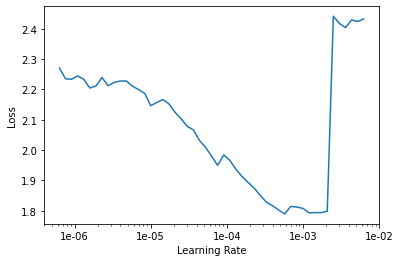

In [14]:
learn.lr_find()
learn.recorder.plot()

GT: 100%|██████████| 1614/1614 [00:00<00:00, 6106.61it/s]


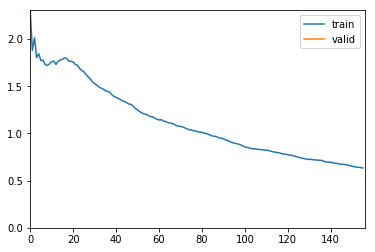

In [15]:
learn.fit_one_cycle(1, 1e-4)

GT: 100%|██████████| 1942/1942 [00:00<00:00, 5448.07it/s]


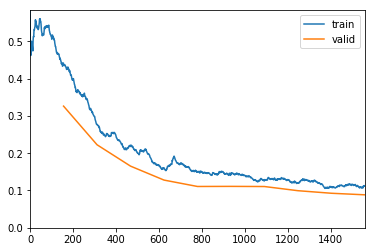

GT: 100%|██████████| 2138/2138 [00:00<00:00, 4523.16it/s]


In [16]:
lr=1e-4
learn.unfreeze()

learn.fit_one_cycle(10, lr)#, callbacks=[SaveModelCallback(learn, every='improvement', monitor='AP-0', name='model')])

In [17]:
lr=1e-4

#for k in range(3):
#    learn.fit_one_cycle(10, lr)

GT: 100%|██████████| 2101/2101 [00:00<00:00, 4621.62it/s]


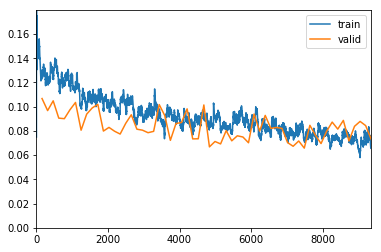

Better model found at epoch 0 with pascal_voc_metric value: 0.8317617027585624.


GT: 100%|██████████| 2045/2045 [00:00<00:00, 5615.50it/s]


Better model found at epoch 2 with pascal_voc_metric value: 0.8552559770886614.


GT: 100%|██████████| 2043/2043 [00:00<00:00, 5666.74it/s]


Better model found at epoch 8 with pascal_voc_metric value: 0.8607497358171644.


GT: 100%|██████████| 2074/2074 [00:00<00:00, 5462.97it/s]


Better model found at epoch 9 with pascal_voc_metric value: 0.8648317430761373.


GT: 100%|██████████| 2061/2061 [00:00<00:00, 5554.29it/s]


Better model found at epoch 19 with pascal_voc_metric value: 0.8763160612133877.


GT: 100%|██████████| 2075/2075 [00:00<00:00, 5654.70it/s]


Better model found at epoch 22 with pascal_voc_metric value: 0.8952306871758872.


GT: 100%|██████████| 2050/2050 [00:00<00:00, 5487.23it/s]


Better model found at epoch 29 with pascal_voc_metric value: 0.8964218354741492.


GT: 100%|██████████| 2063/2063 [00:00<00:00, 5598.53it/s]


Better model found at epoch 56 with pascal_voc_metric value: 0.8970759610260479.


GT: 100%|██████████| 2112/2112 [00:00<00:00, 5537.87it/s]


In [18]:
learn.unfreeze()
lr=1e-4

learn.fit(60, lr, callbacks=[SaveModelCallback(learn, every='improvement', monitor='pascal_voc_metric', name='model')])

In [19]:
#learn.save('RetinaNet-ODAEL-small-ave-2.pth', with_opt=True) 
#learn.fit(30, lr, callbacks=[SaveModelCallback(learn, every='improvement', monitor='AP-0', name='model')])

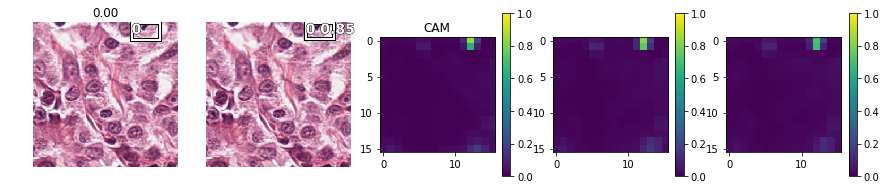

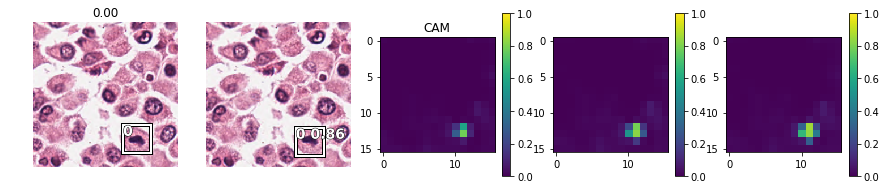

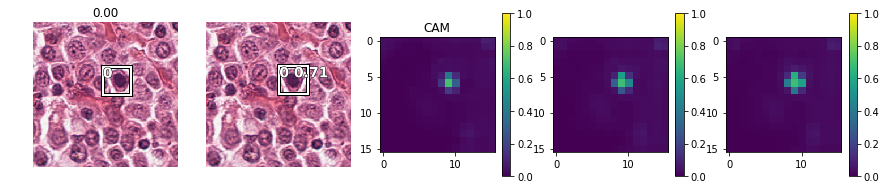

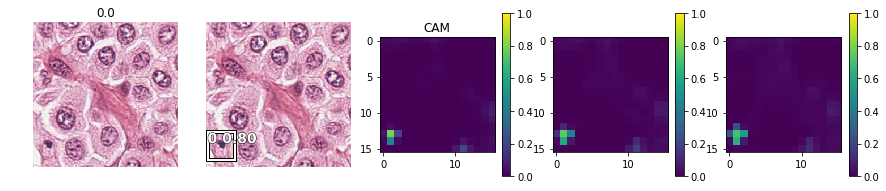

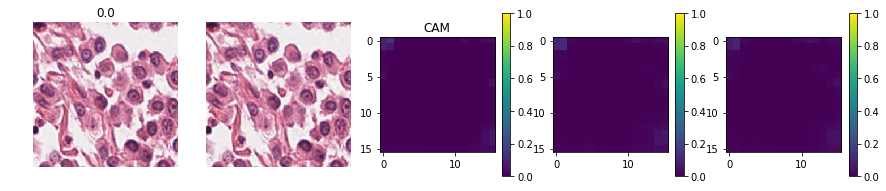

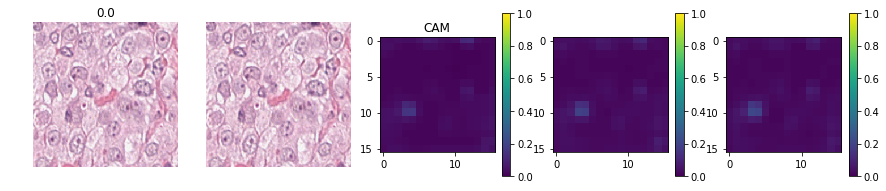

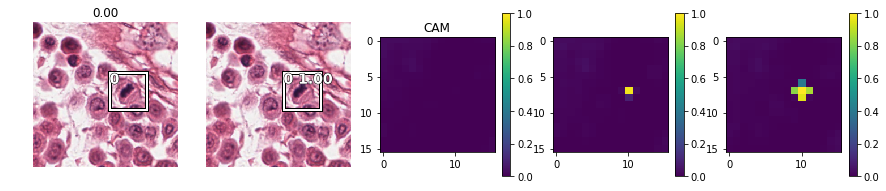

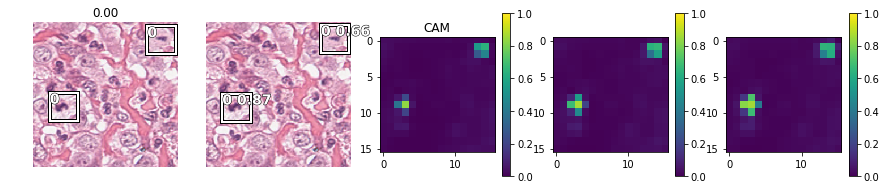

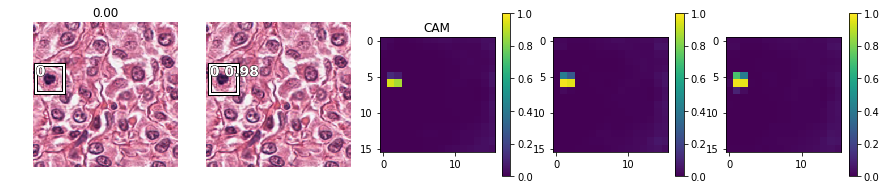

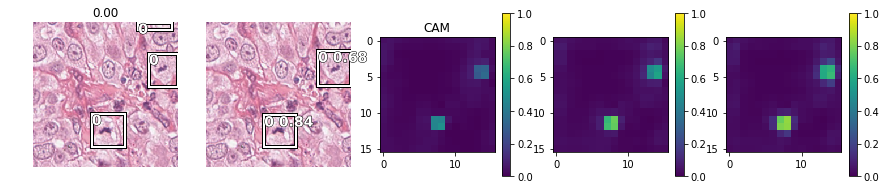

In [20]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=10)

In [21]:
learn.save('RetinaNe-ODAEL-50HPF-save.pth', with_opt=True)
learn.export("RetinaNet-ODAEL-50HPF-export.pth")